In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils import data
import torchvision
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from PIL import Image

torch.__version__

'2.0.1'

In [3]:
imgs_path = glob.glob('F:/Anime_pix2pix/data/train/*.png')
len(imgs_path)

350

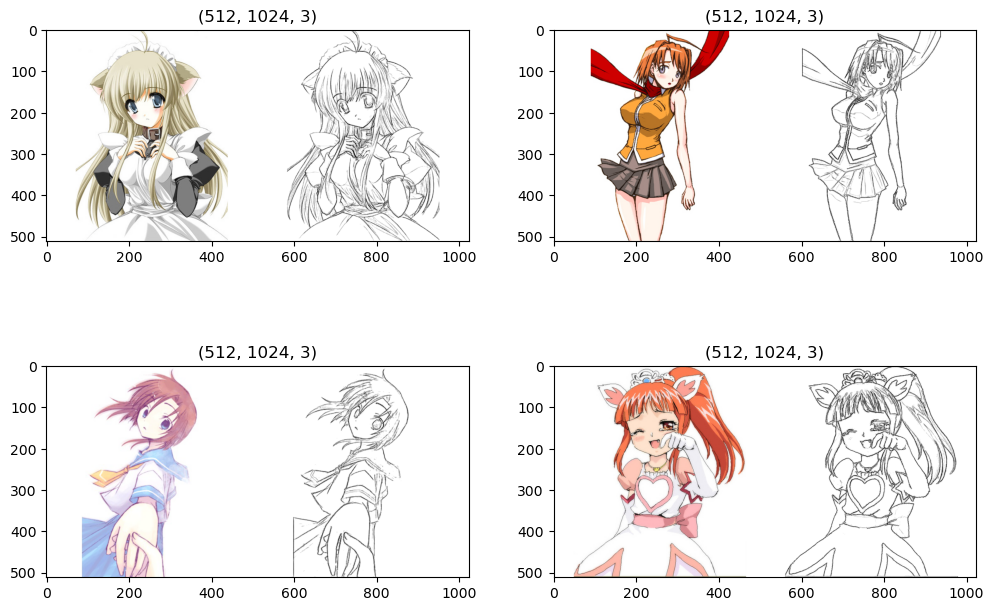

In [4]:
plt.figure(figsize=(12,8))
for i,img_path in enumerate(imgs_path[:4]):
    img = Image.open(img_path)
    np_img = np.array(img)
    plt.subplot(2,2,i+1)
    plt.imshow(np_img)
    plt.title(str(np_img.shape))
plt.show()

In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((256,512)),     # high-256,width-512
    transforms.Normalize(0.5,0.5)
])

In [6]:
class Anime_dataset(data.Dataset):
    def __init__(self, imgs_path):
        self.imgs_path = imgs_path
    def __getitem__(self, index):
        imgs_path = self.imgs_path[index]
        pil_img = Image.open(imgs_path)
        pil_img = transform(pil_img)
        # print(pil_img.size())    # (3,256,512)
        w = pil_img.size(2) // 2
        return pil_img[:,:,w:], pil_img[:,:,:w]
    def __len__(self):
        return len(self.imgs_path)

In [7]:
dataset = Anime_dataset(imgs_path)
len(dataset)

350

In [8]:
dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=32,
    shuffle=True
)

In [9]:
imgs_batch, masks_batch = next(iter(dataloader)) # return one batch

e:\anaconda\lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


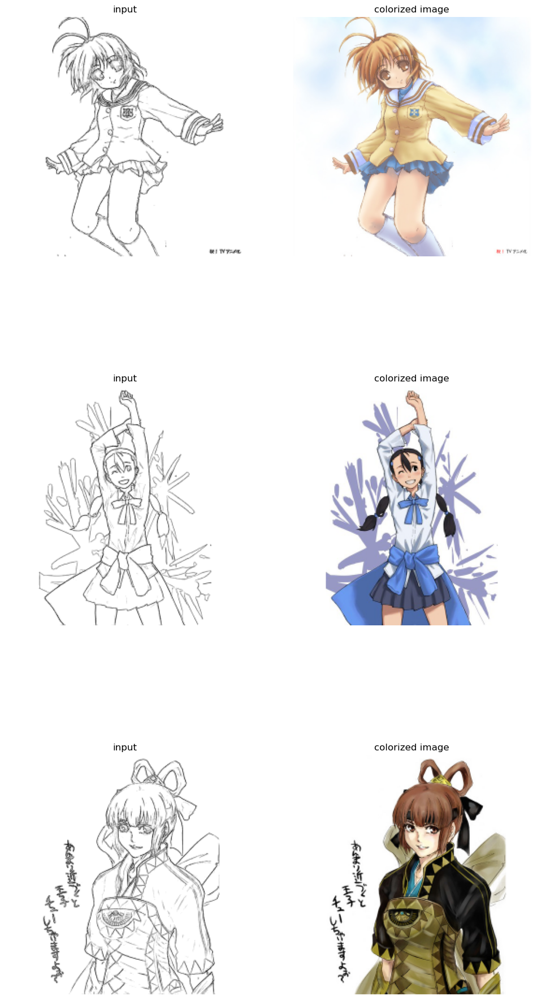

In [10]:
plt.figure(figsize=(12,24))
for i, (img, mask) in enumerate(zip(imgs_batch[:3], masks_batch[:3])):
    # 把channel放到最后end,data还原到0-1
    img = (img.permute(1,2,0).numpy()+1) / 2
    mask = (mask.permute(1,2,0).numpy()+1) / 2
    plt.subplot(3,2,2*i+1)
    plt.title('input')
    plt.axis('off')
    plt.imshow(img)
    plt.subplot(3,2,2*i+2)
    plt.title('colorized image')
    plt.axis('off')
    plt.imshow(mask)
plt.show()

In [10]:
imgs_path_test = glob.glob('F:/Anime_pix2pix/data/val/*.png')
len(imgs_path_test)

3545

In [11]:
dataset_test = Anime_dataset(imgs_path_test)
dataloader_test = torch.utils.data.DataLoader(
    dataset_test,
    batch_size=32,
)

In [12]:
class Downsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Downsample, self).__init__()
        self.conv_relu = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 2, 1),
            nn.LeakyReLU(inplace=True)
        )
        self.bn = nn.BatchNorm2d(out_channels)

    def forward(self, x, is_bn=True):
        x = self.conv_relu(x)
        if is_bn:
            x = self.bn(x)
        return x

In [13]:
class Upsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Upsample, self).__init__()
        self.upconv_relu = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, 3, 2, 1,
                               output_padding=1),
            nn.LeakyReLU(inplace=True)
        )
        self.bn = nn.BatchNorm2d(out_channels)

    def forward(self, x, is_drop=False):
        x = self.upconv_relu(x)
        x = self.bn(x)
        if is_drop:
            x = F.dropout2d(x)
        return x

In [14]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.down1 = Downsample(3, 64)
        self.down2 = Downsample(64, 128)
        self.down3 = Downsample(128, 256)
        self.down4 = Downsample(256, 512)
        self.down5 = Downsample(512, 512)
        self.down6 = Downsample(512, 512)
        self.down7 = Downsample(512, 512)
        self.down8 = Downsample(512, 512)
        
        self.up1 = Upsample(512, 512)
        self.up2 = Upsample(1024, 512)
        self.up3 = Upsample(1024, 512)
        self.up4 = Upsample(1024, 512)
        self.up5 = Upsample(1024, 256)
        self.up6 = Upsample(512, 128)
        self.up7 = Upsample(256, 64)

        self.last = nn.ConvTranspose2d(128, 3, 
                                       kernel_size=3,
                                       stride=2,
                                       padding=1,
                                       output_padding=1)
        

    def forward(self, x):
        x1 = self.down1(x)                # torch.Size([8, 64, 128, 128])
        x2 = self.down2(x1)               # torch.Size([8, 128, 64, 64])
        x3 = self.down3(x2)               # torch.Size([8, 256, 32, 32])
        x4 = self.down4(x3)               # torch.Size([8, 512, 16, 16])
        x5 = self.down5(x4)               # torch.Size([8, 512, 8, 8])
        x6 = self.down6(x5)               # torch.Size([8, 512, 4, 4])
        x7 = self.down7(x6)               # torch.Size([8, 512, 2, 2])
        x8 = self.down8(x7)               # torch.Size([8, 512, 1, 1])
        
        x8 = self.up1(x8, is_drop=True)   # torch.Size([8, 512, 2, 2])
        x8 = torch.cat([x7, x8], dim=1)   # torch.Size([8, 1024, 2, 2])

        x8 = self.up2(x8, is_drop=True)   # torch.Size([8, 512, 4, 4])
        x8 = torch.cat([x6, x8], dim=1)   # torch.Size([8, 1024, 2, 2])
        
        x8 = self.up3(x8, is_drop=True)   # torch.Size([8, 512, 8, 8])
        x8 = torch.cat([x5, x8], dim=1)   # torch.Size([8, 1024, 8, 8])
        
        x8 = self.up4(x8)                 # torch.Size([8, 512, 16, 16])
        x8 = torch.cat([x4, x8], dim=1)   # torch.Size([8, 1024, 16, 16])
        
        x8 = self.up5(x8)                         
        x8 = torch.cat([x3, x8], dim=1)          
        
        x8 = self.up6(x8)                       
        x8 = torch.cat([x2, x8], dim=1)         
        
        x8 = self.up7(x8)                        
        x8 = torch.cat([x1, x8], dim=1)         
        
        x8 = torch.tanh(self.last(x8))           
        return x8

In [15]:
# 定义判别器
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.down1 = Downsample(6, 64)
        self.down2 = Downsample(64, 128)
        self.down3 = Downsample(128, 256)
        self.conv = nn.Conv2d(256, 512, 3, 1, 1)
        self.bn = nn.BatchNorm2d(512)
        self.last = nn.Conv2d(512, 1, 3, 1)

    def forward(self, img, musk):
        x = torch.cat([img, musk], axis=1)
        x = self.down1(x, is_bn=False)
        x = self.down2(x)
        x = F.dropout2d(self.down3(x))
        x = F.dropout2d(F.leaky_relu(self.conv(x)))
        x = F.dropout2d(self.bn(x))
        x = torch.sigmoid(self.last(x))
        return x

In [16]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
if device == 'cuda':
    print('using cuda:', torch.cuda.get_device_name(0))
else:
    print(device)

using cuda: Tesla P100-PCIE-16GB


In [17]:
gen = Generator().to(device)
dis = Discriminator().to(device)
loss_fn = torch.nn.BCELoss()                   # 定义损失函数
d_optimizer = torch.optim.Adam(dis.parameters(), lr=6e-5, betas=(0.5, 0.999))
g_optimizer = torch.optim.Adam(gen.parameters(), lr=2e-4, betas=(0.5, 0.999))
d_scheduler = torch.optim.lr_scheduler.StepLR(d_optimizer, step_size=5, gamma = 0.7)

In [18]:
def generate_images(model, test_input, true_target):
    prediction = model(test_input).permute(0, 2, 3, 1).detach().cpu().numpy()
    test_input = test_input.permute(0, 2, 3, 1).cpu().numpy()
    true_target = true_target.permute(0, 2, 3, 1).cpu().numpy()
    plt.figure(figsize=(15, 15))
    display_list = [test_input[0], true_target[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [19]:
LAMBDA = 10
imgs_batch = imgs_batch.to(device) 
musks_batch = masks_batch.to(device)

开始第 1 轮
Epoch: 0


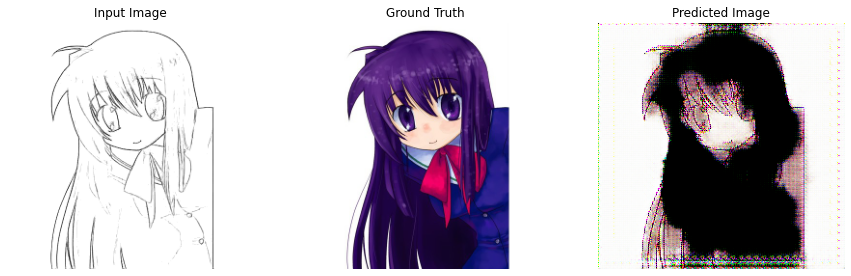

开始第 2 轮
Epoch: 1


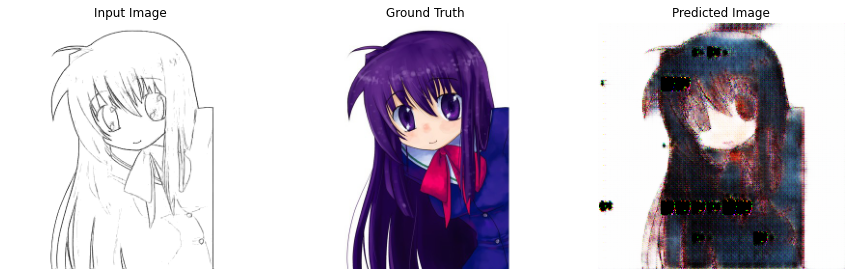

开始第 3 轮
Epoch: 2


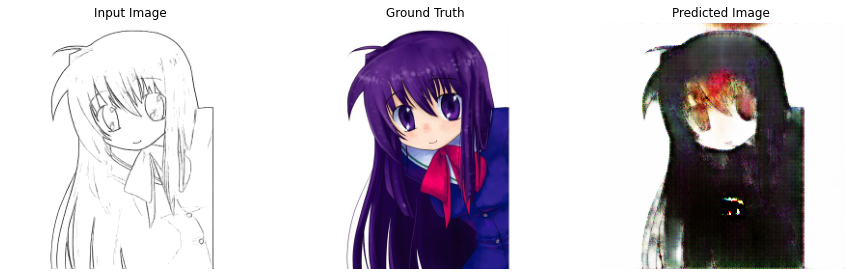

开始第 4 轮
Epoch: 3


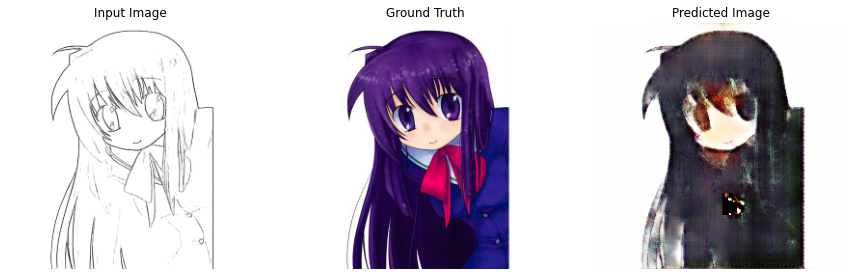

开始第 5 轮
Epoch: 4


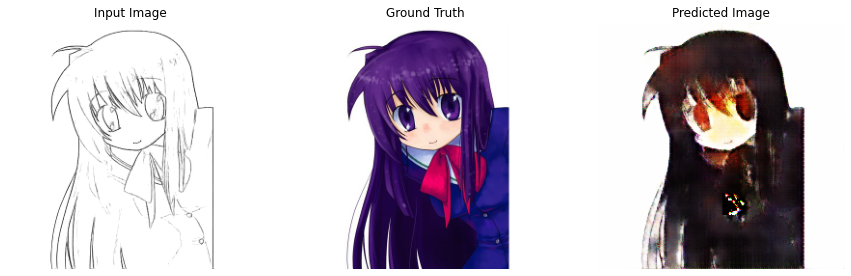

开始第 6 轮
Epoch: 5


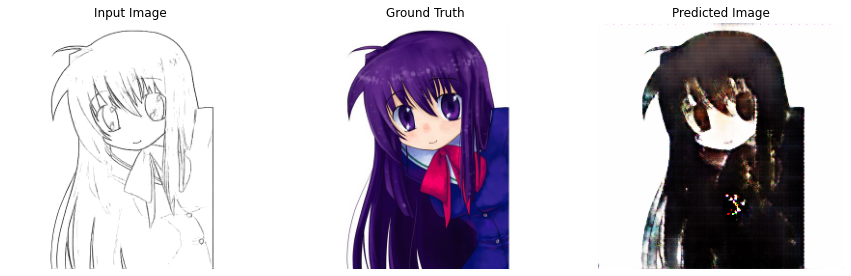

开始第 7 轮
Epoch: 6


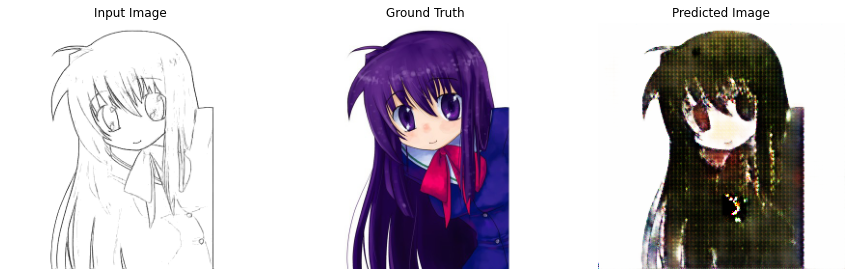

开始第 8 轮
Epoch: 7


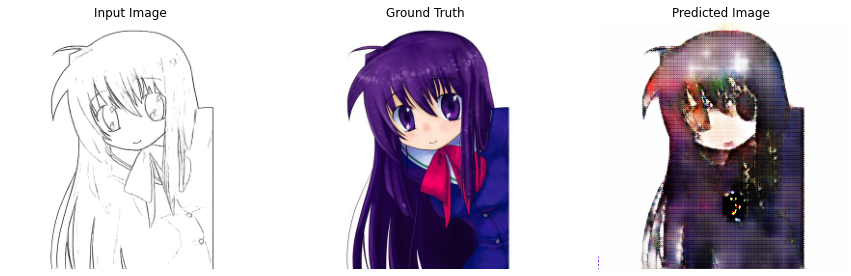

开始第 9 轮
Epoch: 8


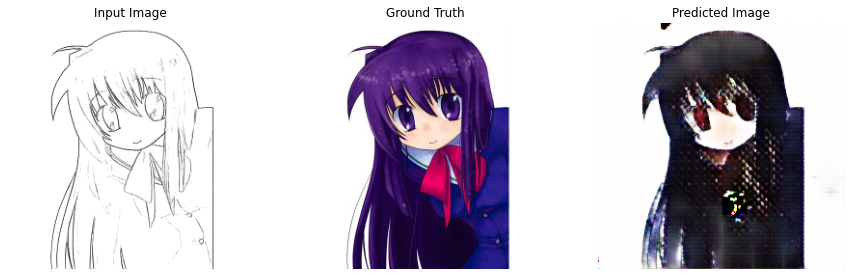

开始第 10 轮
Epoch: 9


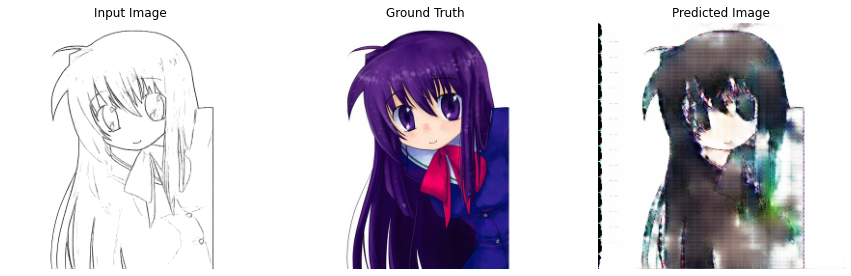

开始第 11 轮
Epoch: 10


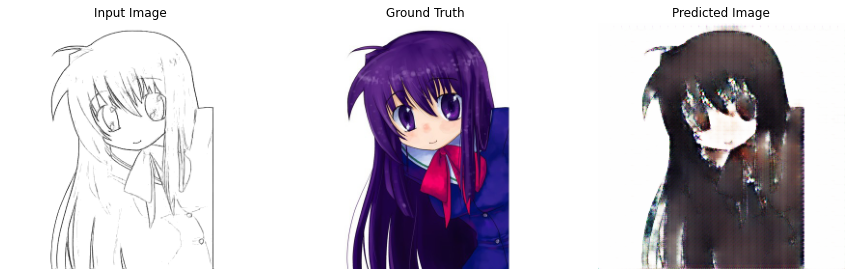

开始第 12 轮
Epoch: 11


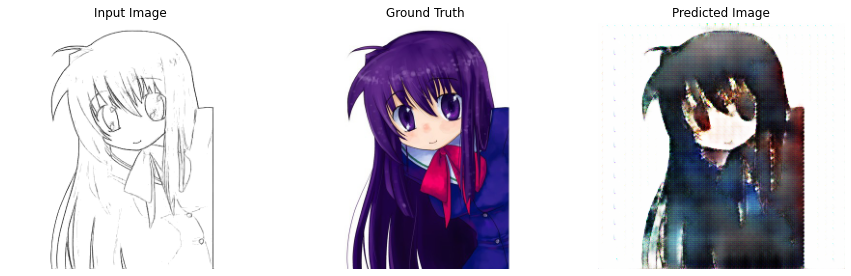

开始第 13 轮
Epoch: 12


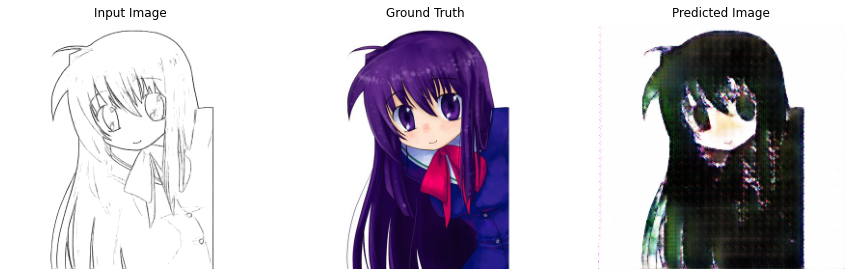

开始第 14 轮
Epoch: 13


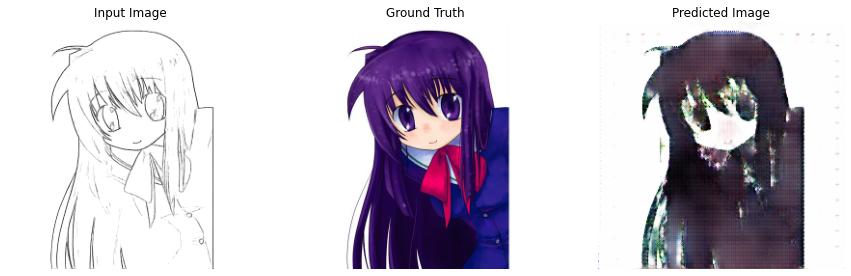

开始第 15 轮
Epoch: 14


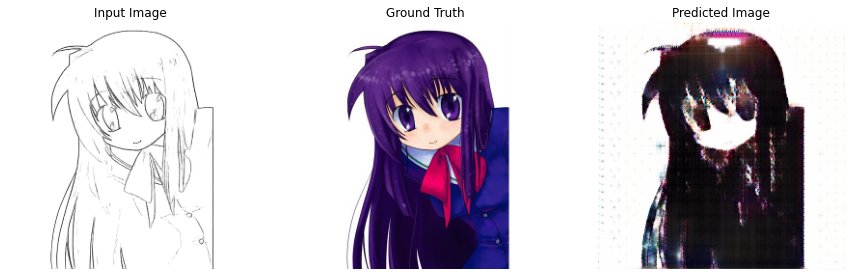

开始第 16 轮
Epoch: 15


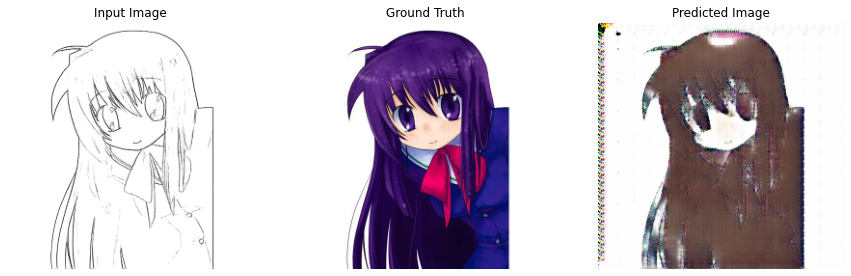

开始第 17 轮
Epoch: 16


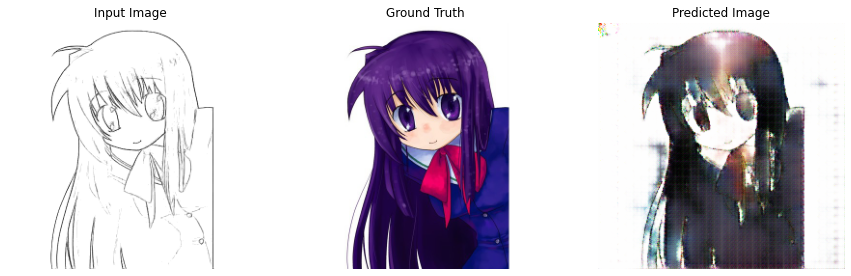

开始第 18 轮
Epoch: 17


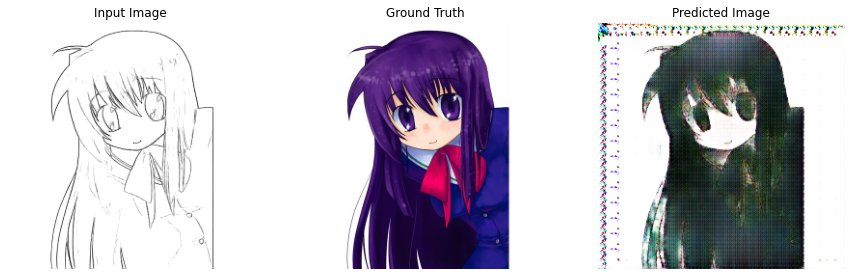

开始第 19 轮
Epoch: 18


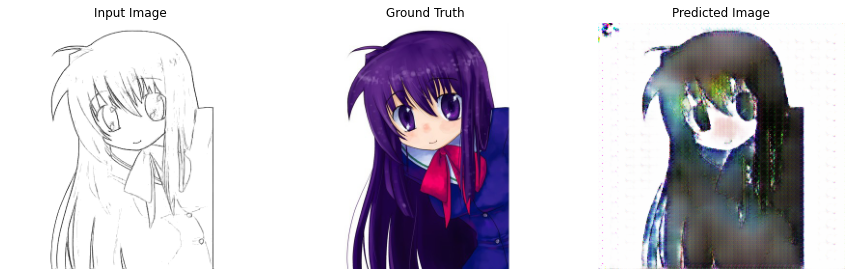

开始第 20 轮
Epoch: 19


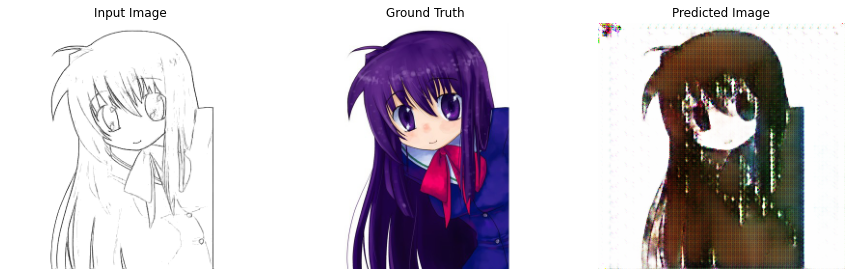

开始第 21 轮
Epoch: 20


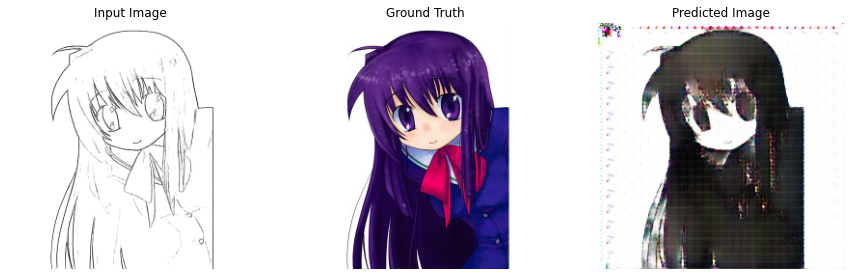

开始第 22 轮
Epoch: 21


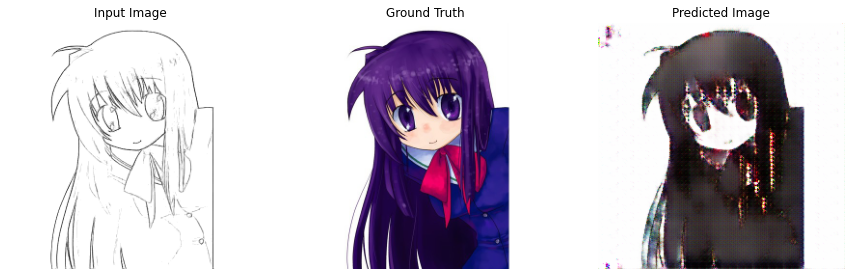

开始第 23 轮
Epoch: 22


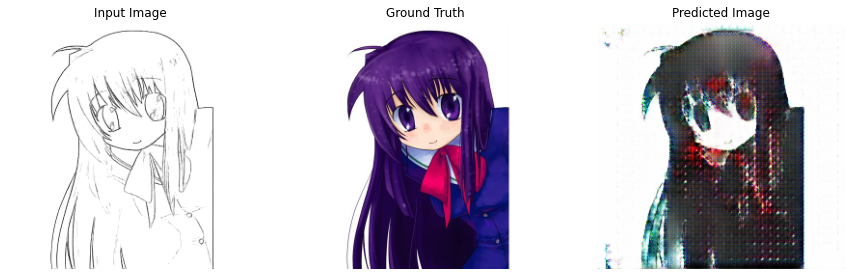

开始第 24 轮
Epoch: 23


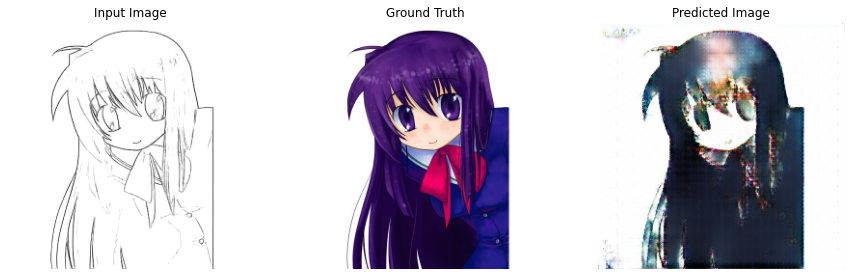

开始第 25 轮
Epoch: 24


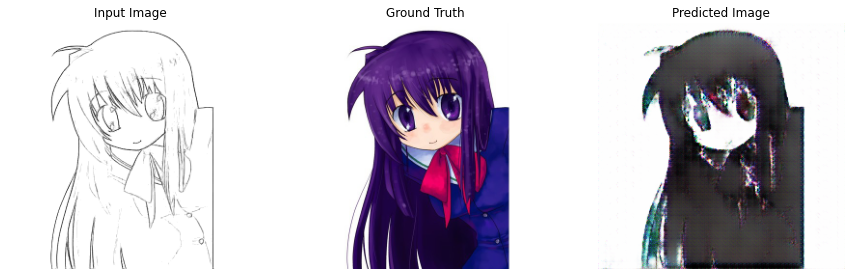

开始第 26 轮
Epoch: 25


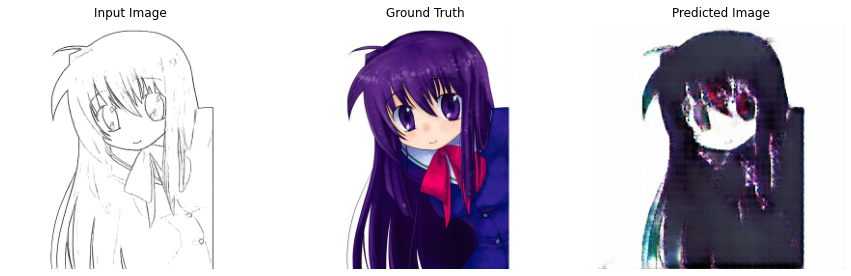

开始第 27 轮
Epoch: 26


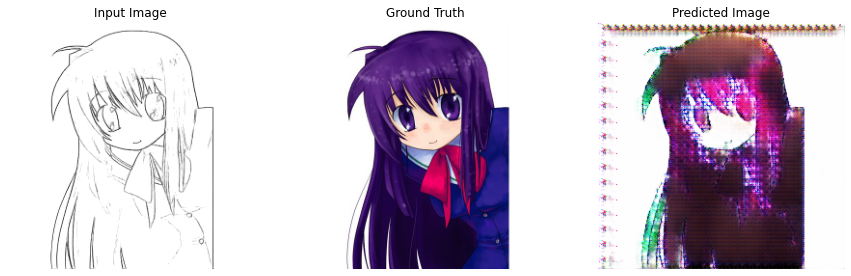

开始第 28 轮
Epoch: 27


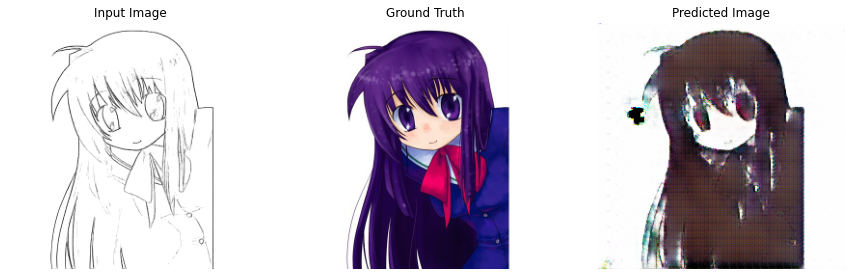

开始第 29 轮
Epoch: 28


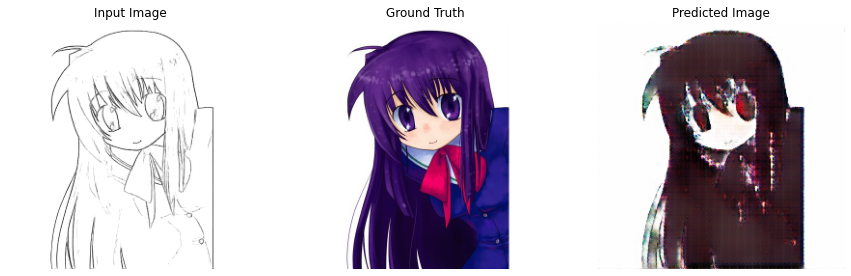

开始第 30 轮
Epoch: 29


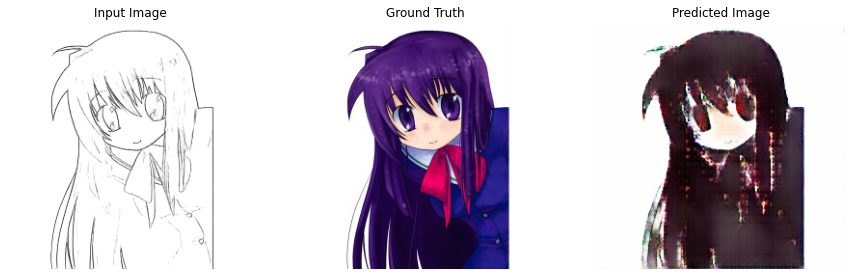

开始第 31 轮
Epoch: 30


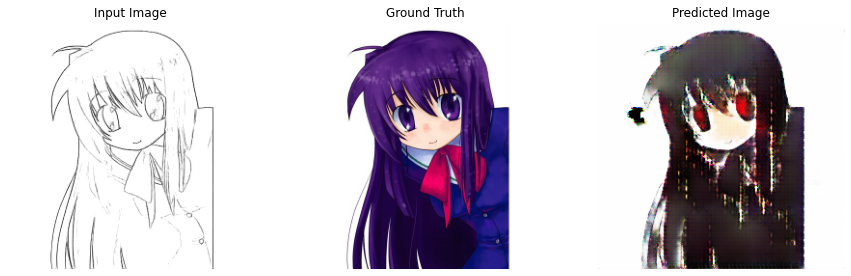

开始第 32 轮
Epoch: 31


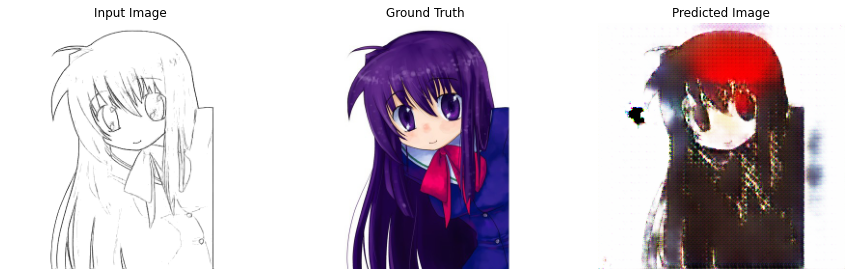

开始第 33 轮
Epoch: 32


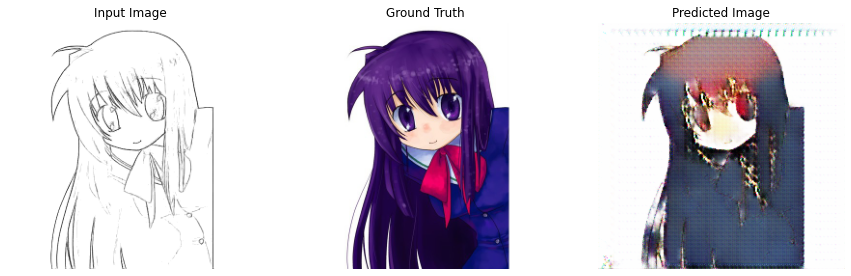

开始第 34 轮
Epoch: 33


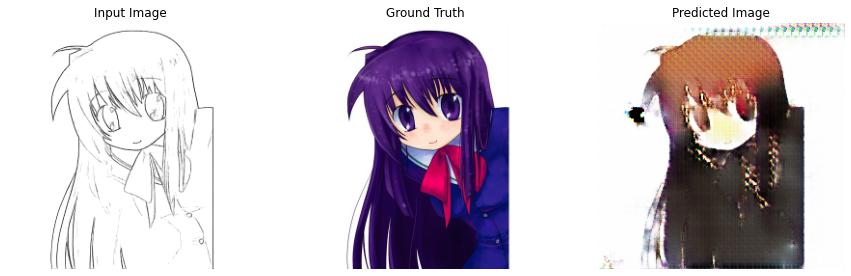

开始第 35 轮
Epoch: 34


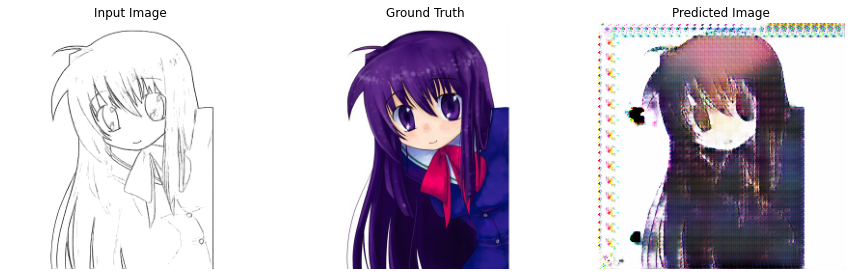

开始第 36 轮
Epoch: 35


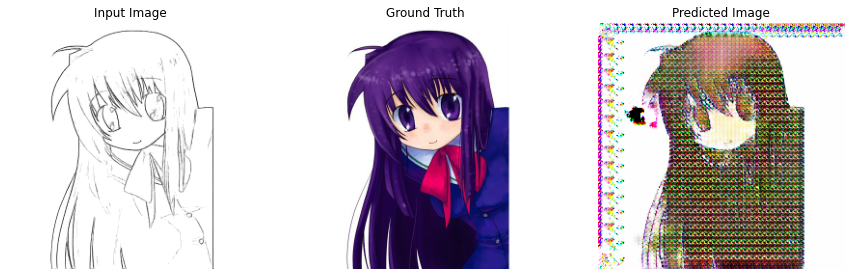

开始第 37 轮
Epoch: 36


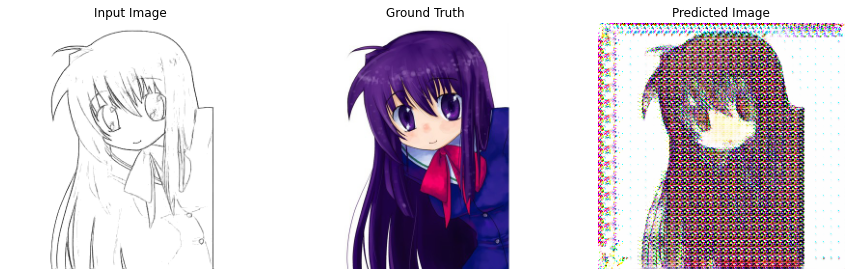

开始第 38 轮
Epoch: 37


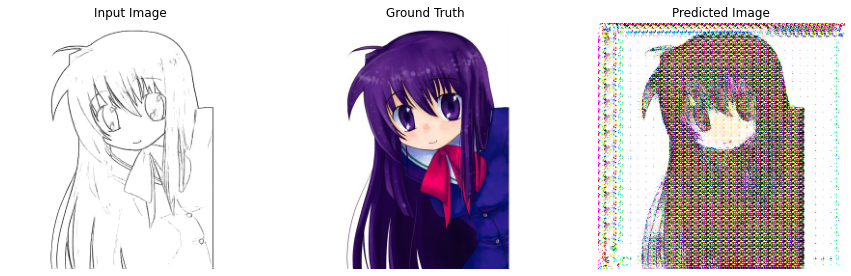

开始第 39 轮
Epoch: 38


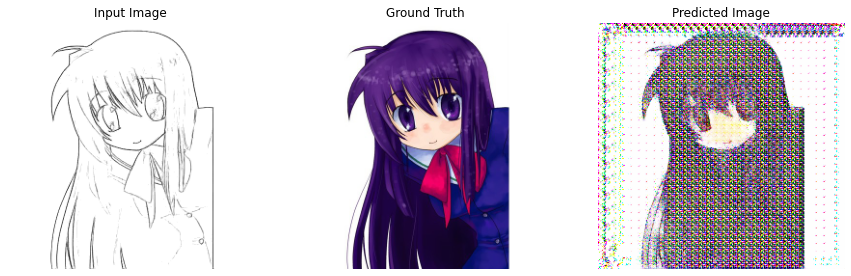

开始第 40 轮
Epoch: 39


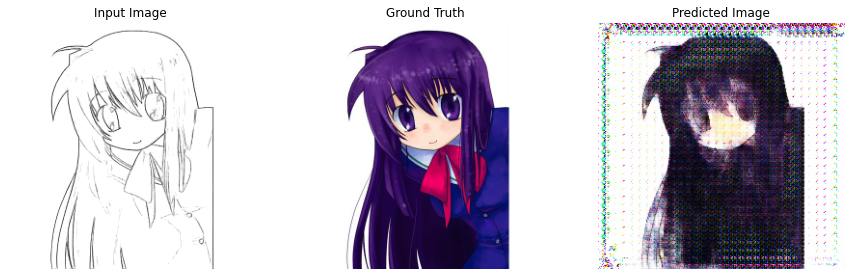

/opt/conda/lib/python3.7/site-packages/torch/serialization.py:405: UserWarning: Couldn't retrieve source code for container of type Generator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:405: UserWarning: Couldn't retrieve source code for container of type Downsample. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:405: UserWarning: Couldn't retrieve source code for container of type Upsample. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/opt/conda/lib/python3.7/site-packages/torch/serialization.py:405: UserWarning: Couldn't retrieve source code for container of type Discriminator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [20]:
D_loss = []                          # 记录训练过程中判别器loss变化
G_loss = []                          # 记录训练过程中生成器loss变化

#开始训练
for epoch in range(40):
    print('开始第',epoch+1,'轮')
    D_epoch_loss=0
    G_epoch_loss=0
    count = len(dataloader)
    for step, (imgs, masks) in enumerate(dataloader):
        imgs = imgs.to(device)
        masks = masks.to(device)
        
        d_optimizer.zero_grad()
        disc_real_output = dis(imgs, masks)              # 判别器输入真实图片
        d_real_loss = loss_fn(disc_real_output, 
                              torch.ones_like(disc_real_output, device=device))
        d_real_loss.backward()
        # 生成器输入随机张量得到生成图片
        gen_output = gen(imgs) 
        # 判别器输入生成图像，注意此处的detach方法
        disc_gen_output = dis(imgs, gen_output.detach()) 
        d_fake_loss = loss_fn(disc_gen_output, 
                              torch.zeros_like(disc_gen_output, device=device))
        d_fake_loss.backward()
        
        disc_loss = d_real_loss + d_fake_loss      # 判别器的总损失
        d_optimizer.step()
        
        g_optimizer.zero_grad()
        disc_gen_output = dis(imgs, gen_output)           # 判别器输入生成图像
        gen_loss_crossentropy = loss_fn(disc_gen_output, 
                                        torch.ones_like(disc_gen_output, device=device))
        gen_l1_loss = torch.mean(torch.abs(masks - gen_output))
        gen_loss = gen_loss_crossentropy + (LAMBDA * gen_l1_loss)
        gen_loss.backward()
        g_optimizer.step()
        
        with torch.no_grad():
            D_epoch_loss += disc_loss.item()
            G_epoch_loss += gen_loss.item()
#            generate_images(gen, imgs_batch, masks_batch)
    d_scheduler.step()
    with torch.no_grad():        
        D_epoch_loss /= count
        G_epoch_loss /= count
        D_loss.append(D_epoch_loss)
        G_loss.append(G_epoch_loss)
        # 训练完一个Epoch，打印提示并绘制生成的图片
        print("Epoch:", epoch)
        generate_images(gen, imgs_batch, masks_batch)

        
torch.save(gen,'gen.pth',_use_new_zipfile_serialization=False)
torch.save(dis,'dis.pth', _use_new_zipfile_serialization=False)